In [2]:
using Pkg
using GeometricIntegrators
using Plots
# Pkg.update("AbstractNeuralNetworks")
using AbstractNeuralNetworks

Pkg.status("AbstractNeuralNetworks")
Pkg.status("GeometricIntegrators")

using KernelAbstractions

Pkg.activate("./GeometricMachineLearning.jl")
using GeometricMachineLearning

using CUDA



Status `~/.julia/environments/v1.9/Project.toml`
  [60874f82] AbstractNeuralNetworks v0.1.1
Status `~/.julia/environments/v1.9/Project.toml`
⌃ [dcce2d33] GeometricIntegrators v0.12.1
Info Packages marked with ⌃ have new versions available and may be upgradable.


  Activating project at `/mnt/c/Users/guill/workspace/CEMRACS/Cemracs2023/Guillaume/GeometricMachineLearning.jl`
[ Info: Precompiling GeometricMachineLearning [194d25b2-d3f5-49f0-af24-c124f4aa80cc]
  ** incremental compilation may be fatally broken for this module **

  ** incremental compilation may be fatally broken for this module **

  ** incremental compilation may be fatally broken for this module **

  ** incremental compilation may be fatally broken for this module **

  ** incremental compilation may be fatally broken for this module **

  ** incremental compilation may be fatally broken for this module **

  ** incremental compilation may be fatally broken for this module **

  ** incremental compilation may be fatally broken for this module **

  ** incremental compilation may be fatally broken for this module **

  ** incremental compilation may be fatally broken for this module **

ERROR: LoadError: UndefVarError: `TestUtils` not defined
Stacktrace:
 [1] include
   @ ./Bas

In [5]:
# using IJulia
# installkernel("Julia (10 threads)", env = Dict("JULIA_NUM_THREADS" => "10"))
# Threads.nthreads()

### Integrator

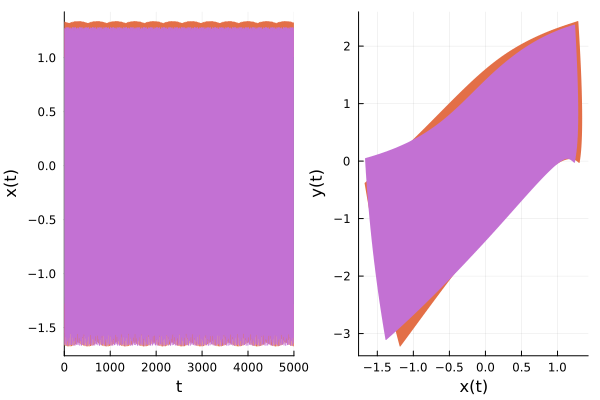

In [8]:
# params = (m1 = [2,3], m2 = [2,3], k1 = [0.1,0.2], k2 =  [0.1,0.2], k =  [0.1,0.2])
params = (m1 = 1, m2 = 2, k1 = 0.1, k2 = 0.1, k = 0.2)

t_integration = 5000

function q̇(v, t, q, p, params)
    v[1] = p[1]/params.m1
    v[2] = p[2]/params.m2
end

function σ(x::T) where T
    T(1)/(T(1)+exp(-x))
end

function ṗ(f, t, q, p, params)
    f[1] = -params.k1 * q[1] - params.k * (q[1] - q[2]) * σ(q[1]) - params.k /2 * (q[1] - q[2])^2 * σ(q[1])^2 * exp(-q[1])
    f[2] = -params.k2 * q[2] + params.k * (q[1] - q[2]) * σ(q[1])
end


plot1 = plot(xlims=[0,t_integration], xlab="t", ylab="x(t)", legend=:none)
plot2 = plot( xlab="x(t)", ylab="y(t)", legend=:none)

x = Vector{Vector}()
x = []

for k0 in LinRange(1.5, 2.5, 2) 
    for p1 in LinRange(0.1, 2, 2) 
        params = (m1=2, m2=0.25, k1=1.5, k2=0.1, k=k0)
        pode = PODEProblem( q̇, ṗ, (0.0, t_integration), 0.1, [1.,0.], [p1, 0.]; parameters = params)
        sol = integrate(pode,ImplicitMidpoint())
        # Add for input and output
        push!(x, [sol.q[:,1], sol.q[:,2], sol.p[:,1], sol.p[:,2]])
        plot!(plot1,sol.t, sol.q[:,1])
        plot!(plot2, sol.q[:,1], sol.q[:,2])
    end
end

n_params = 4
plot(plot1, plot2, layout = 2)



In [9]:

@kernel function to_matrix!(matrix, x)
    i,j,k = @index(Global, NTuple)
    matrix[i,j,k] = x[i][j][k]
end
x_matrix = zeros(n_params, 4,t_integration)
kernel! = to_matrix!(CPU())
kernel!(x_matrix, x, ndrange = size(x_matrix))
x_matrix = Float32.(x_matrix)

4×4×5000 Array{Float32, 3}:
[:, :, 1] =
 0.998185  0.0216475  -0.172618  0.108238
 1.09282   0.0229551   1.7127    0.114776
 0.99619   0.0357753  -0.252404  0.178877
 1.0907    0.0379322   1.628     0.189661

[:, :, 2] =
 0.982951  0.0853351  -0.436705  0.2102
 1.17076   0.0931077   1.40519   0.235987
 0.975288  0.139846   -0.583688  0.341476
 1.16239   0.152548    1.23973   0.383419

[:, :, 3] =
 0.95496   0.187251  -0.682959  0.299378
 1.23312   0.21141    1.08915   0.355525
 0.938852  0.302578  -0.873739  0.472185
 1.21492   0.34151    0.861158  0.561388

;;; … 

[:, :, 4998] =
 -1.05184   -0.440509  -1.13263     0.181085
  0.833943   1.98381   -1.66602     0.312171
 -0.257764  -0.904611  -1.06272    -0.728312
  1.24181    2.02876   -0.0119201   0.591886

[:, :, 4999] =
 -1.10395   -0.372377  -0.951778    0.159577
  0.750252   2.07903   -1.6816      0.163907
 -0.312297  -1.17763   -1.1186     -0.636769
  1.24043    2.22686   -0.0432206   0.398645

[:, :, 5000] =
 -1.14682   -0.31361

In [10]:

const batch_size = 10
time_steps = Int.(floor.(rand(batch_size)*1000))
params = Int(ceil(rand()*n_params))
@kernel function get_batch!(batch_matrix, input, params, time_steps)
    i,j = @index(Global, NTuple)
    batch_matrix[i,j] = input[params,i,time_steps[j]]
end
input_matrix = zeros(4,batch_size)
output_matrix = zeros(4,batch_size)
kernel! = get_batch!(CPU())
kernel!(input_matrix, x_matrix,params, time_steps, ndrange = size(input_matrix))
kernel!(output_matrix, x_matrix,params, time_steps .+ 1, ndrange = size(input_matrix))

In [11]:
@kernel function get_all_dataset!(ds_input_matrix, input, param)
    i,j = @index(Global, NTuple)
    ds_input_matrix[i,j] = input[j÷1001+1][i][j÷n_params + param]
end
ds_input_matrix = zeros(4, (n_params-1)*(1001)) 
ds_output_matrix = zeros(4, (n_params-1)*(1001)) 
kernel! = get_all_dataset!(CPU())
kernel!(ds_input_matrix, x, 0, ndrange = size(ds_input_matrix))
kernel!(ds_output_matrix, x, 1, ndrange = size(ds_output_matrix))

### ResNet

In [13]:
using GeometricMachineLearning: ResNet
using Random
using LinearAlgebra
using Zygote
using ProgressMeter
using AbstractNeuralNetworks

model = Chain(ResNet(4, tanh), 
            ResNet(4, tanh), 
            ResNet(4)
)

ps = initialparameters(CPU(),Float32, model)
model(input_matrix[:,1] , ps)
# apply(model,input_matrix[:,1] |> cu, ps, st)[1]

n_time_steps = t_integration 
const batch_size = 100
n_epochs = 200
opt = Optimizer(AdamOptimizer(), ps)

function loss(ps, x, y)
    norm(model(x, ps) - y)/size(x,2)^(0.5) 
end
println(loss(ps, ds_input_matrix  , ds_output_matrix))

input_matrix = zeros(4,batch_size)
output_matrix = zeros(4,batch_size)

@showprogress "training network" for _ in 1:(n_params * n_time_steps ÷ batch_size*n_epochs)
    time_steps = Int.(floor.(rand(batch_size) * (n_time_steps - 1) .+ 1))
    params = Int(ceil(rand()*n_params ))
    input_matrix = x_matrix[params, :, time_steps]
    output_matrix = x_matrix[params, :, time_steps .+ 1]
    # kernel! = get_batch!(CUDABackend())
    # kernel!(input_matrix, x,params, time_steps |> cu, ndrange = size(input_matrix))
    # kernel!(output_matrix, x,params, time_steps .+ 1, ndrange = size(input_matrix))
    grad = Zygote.gradient(p -> loss(p, input_matrix, output_matrix ), ps)[1]
    optimization_step!(opt, model, ps, grad)
    # println(loss(ps, ds_input_matrix, ds_output_matrix))
end
println(loss(ps, ds_input_matrix  , ds_output_matrix))

3.851554385409212


training network 100%|███████████████████████████████████| Time: 0:00:202:26


0.02646914961048233


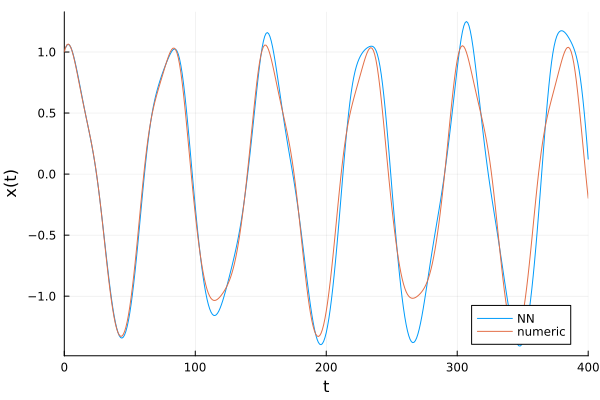

In [14]:
n_int = 400
xt = [1, 0., 0.9, 0.]
x0 = xt
X = (q1 = [], q2 = [], p1 = [], p2 = [])
for t in 1:n_int
    xt = model(xt, ps)
    push!(X.q1, xt[1])
    push!(X.q2, xt[2])
    push!(X.p1, xt[3])
    push!(X.p2, xt[4])
end
params = (m1=2, m2=0.25, k1=1.5, k2=0.1, k=1.9)
pode = PODEProblem(q̇, ṗ, (0.0, n_int), 0.1, x0[1:2],  x0[3:4]; parameters = params)
sol = integrate(pode,ImplicitMidpoint())
p1 = plot(xlims=[0,n_int], xlab="t", ylab="x(t)", legend=:bottomright)
plot!(p1,X.q1, label="NN")
plot!(p1,sol.q[:,1], label="numeric")

# p1 = plot( xlab="t", ylab="x(t)", legend=:bottomright)
# plot!(p1,sol.q[:,1], sol.q[:,2], label="numeric")
# plot!(p1,X.q1, X.q2, label="model")



### SympNet

In [20]:
model_symp = Chain(Gradient(4,10, tanh; change_q=true),
            Gradient(4,10, tanh; change_q=false),
            Gradient(4,10, tanh; change_q=true),
            Gradient(4,10, tanh; change_q=false),
            Gradient(4,4; change_q=true),
            Gradient(4,4; change_q=false)
)

ps = initialparameters(CPU(),Float32, model_symp)
model_symp(input_matrix[:,1], ps)

n_time_steps = t_integration
const batch_size = 100
n_epochs = 3
opt = Optimizer(AdamOptimizer(0.001), ps)

function loss(ps, x, y)
    norm(model_symp(x, ps) - y)/size(x,2)^(0.5) 
end
println(loss(ps, ds_input_matrix[:,3], ds_output_matrix[:,3]))

function ds_loss(ps, x, y)
    sum([loss(ps, x[:,i], y[:,i]) for i in 1:size(x)[2]]) / size(x)[2]
end
println(loss(ps,ds_input_matrix, ds_output_matrix ))

input_matrix = zeros(4,batch_size)
output_matrix = zeros(4,batch_size)

@showprogress "training sympnet" for _ in 1:(n_params * n_time_steps ÷ batch_size*n_epochs)
    idx = Int.(floor.(1 * (size(ds_input_matrix)[2] -1)) +1)
    time_steps = Int.(floor.(rand(batch_size) * (n_time_steps - 1) .+ 1))
    params = Int(ceil(rand()*n_params ))
    input_matrix = x_matrix[params, :, time_steps]
    output_matrix = x_matrix[params, :, time_steps .+ 1]
    # kernel! = get_batch!(CPU())
    # kernel!(input_matrix, x,params, time_steps, ndrange = size(input_matrix))
    # kernel!(output_matrix, x,params, time_steps .+ 1, ndrange = size(input_matrix))
    grad = Zygote.gradient(p -> loss(p, input_matrix, output_matrix), ps)[1]
    optimization_step!(opt, model_symp, ps, grad)
    # println(loss(ps, ds_input_matrix, ds_output_matrix))
end
println(ds_loss(ps,ds_input_matrix, ds_output_matrix ))

1.3152449164351305
2.437993489741647


training sympnet 100%|███████████████████████████████████| Time: 0:00:02


0.07565474943292769


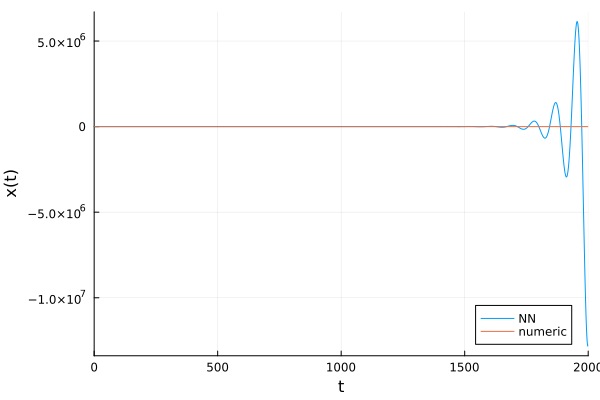

In [22]:
n_int = 2000
xt = [1, 0., 0.9, 0.]
x0 = xt
X = (q1 = [], q2 = [], p1 = [], p2 = [])
for t in 1:n_int
    xt = model_symp(xt, ps)
    push!(X.q1, xt[1])
    push!(X.q2, xt[2])
    push!(X.p1, xt[3])
    push!(X.p2, xt[4])
end
params = (m1=2, m2=0.25, k1=1.5, k2=0.1, k=1.9)
pode = PODEProblem(q̇, ṗ, (0.0, n_int), 0.1, x0[1:2],  x0[3:4]; parameters = params)
sol = integrate(pode,ImplicitMidpoint())
p1 = plot( xlab="t", ylab="x(t)", legend=:bottomright)
plot!(p1,sol.q[:,1], sol.q[:,2], label="numeric")
plot!(p1,X.q1, X.q2, label="model")

p2 = plot(xlims=[0,n_int], xlab="t", ylab="x(t)", legend=:bottomright)
plot!(p2,X.q1, label="NN")
plot!(p2,sol.q[:,1], label="numeric")
# png(p2, "./Images/Sympnet_10000_multi_params")


### Transformer

In [12]:
const n_rolled_steps = 20
const batch_size = 10

time_steps = [Int.(floor.(rand(n_rolled_steps)*(t_integration - 1) .+ 1)) for _ in 1:batch_size]
[time_steps[i] .+ 1 for i in 1:batch_size]
params = Int(ceil(rand()*n_params))


@kernel function get_batch_transformer!(batch_matrix, input, params, time_steps)
    i,j,k = @index(Global, NTuple)
    batch_matrix[i,j,k] = input[params,i,time_steps[k][j]]
end
input_matrix = zeros(Float32,4,n_rolled_steps, batch_size)
output_matrix = zeros(Float32,4,n_rolled_steps, batch_size)
kernel! = get_batch_transformer!(CPU())
kernel!(input_matrix, x_matrix, params, time_steps, ndrange = size(input_matrix))
kernel!(output_matrix, x_matrix, params, [time_steps[i] .+ 1 for i in 1:batch_size], ndrange = size(input_matrix))


In [13]:
batch_size = t_integration - n_rolled_steps -1
time_steps = [[i+j for j in 1:n_rolled_steps] for i in 1:batch_size]

ds_input_matrix = zeros(Float32,4,n_rolled_steps, batch_size)
ds_output_matrix = zeros(Float32,4,n_rolled_steps, batch_size)
kernel! = get_batch_transformer!(CPU())
kernel!(ds_input_matrix, x_matrix, params, time_steps, ndrange = size(ds_input_matrix))
kernel!(ds_output_matrix, x_matrix, params, [time_steps[i] .+ 1 for i in 1:batch_size], ndrange = size(ds_output_matrix))

In [14]:
model_transformer = Chain(MultiHeadAttention(4, 2, Stiefel=false),
                        ResNet(4, tanh),
                        MultiHeadAttention(4, 2, Stiefel=false),
                        ResNet(4, tanh),
                        MultiHeadAttention(4, 2, Stiefel=false),
                        ResNet(4)
)

# model_transformer = Transformer(4,4,3,Stiefel = false)

ps_transformer = initialparameters(CPU(),Float32, model_transformer)
model_transformer(input_matrix , ps_transformer)

n_time_steps = t_integration
const n_rolled_steps = 20
const batch_size = 100
n_epochs = 10
n_sequence_prediction = 5

opt = Optimizer(AdamOptimizer(), ps_transformer)

@kernel function assign_output_kernel!(output, tensor)
    i,j = @index(Global, NTuple)
    output[i,j] = tensor[i,n_rolled_steps, j]
end
assign_output! = assign_output_kernel!(CUDABackend())

function loss(ps, x, y)
    norm(model_transformer(x, ps)[:,n_rolled_steps-n_sequence_prediction+1 : n_rolled_steps,:] - y[:,n_rolled_steps-n_sequence_prediction+1 : n_rolled_steps,:])/size(x,3)^(0.5) 
end
println(loss(ps_transformer, input_matrix , output_matrix ))


println(loss(ps_transformer, ds_input_matrix , ds_output_matrix ))

input_matrix = zeros(Float32,4,n_rolled_steps,batch_size)
output_matrix = zeros(Float32,4,n_rolled_steps,batch_size)

p = Progress(n_epochs; enabled=true)

for epochs in 1:(n_epochs)
    for _ in 1:n_params * n_time_steps ÷ batch_size
        time_steps = []
        for i in 1:batch_size
            idx = Int.(floor.(rand() * (n_time_steps - n_rolled_steps - n_sequence_prediction) ))
            time_step = [i + idx for i in 1:n_rolled_steps]
            push!(time_steps, time_step)
        end
        params = Int(ceil(rand()*n_params))
        kernel! = get_batch_transformer!(CPU())
        kernel!(input_matrix, x_matrix ,params, time_steps, ndrange = size(input_matrix))
        kernel!(output_matrix, x_matrix ,params, [time_steps[i] .+ n_sequence_prediction for i in 1:batch_size], ndrange = size(input_matrix))
        grad = Zygote.gradient(p -> loss(p, input_matrix , output_matrix ), ps_transformer)[1]
        optimization_step!(opt, model_transformer, ps_transformer, grad)
    end
    ProgressMeter.next!(p; showvalues = [(:Loss,loss(ps_transformer, ds_input_matrix, ds_output_matrix))])
end

println(loss(ps_transformer, ds_input_matrix, ds_output_matrix))

┌ Warning: ProgressMeter by default refresh meters with additional information in IJulia via `IJulia.clear_output`, which clears all outputs in the cell. 
│  - To prevent this behaviour, do `ProgressMeter.ijulia_behavior(:append)`. 
│  - To disable this warning message, do `ProgressMeter.ijulia_behavior(:clear)`.
└ @ ProgressMeter ~/.julia/packages/ProgressMeter/sN2xr/src/ProgressMeter.jl:618
Progress:  70%|████████████████████████████▊            |  ETA: 0:02:02
  Loss:  1.499659010906932

LoadError: InterruptException:

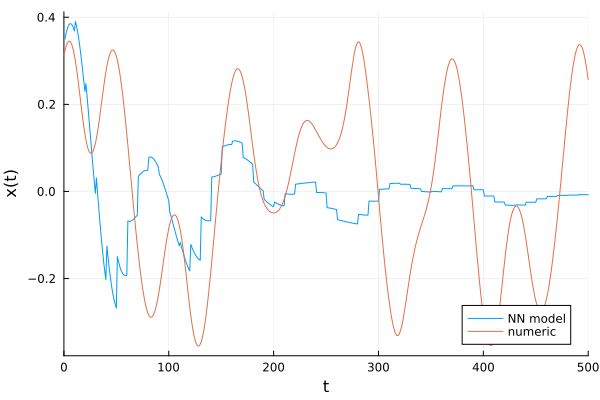

In [ ]:
# Constructing 8 time steps to be unrolled for the transformer
n_int = 50
xt = [0.1,0.4,0.5,0.4]
params = (m1 = 2, m2 = 2, k1 = 1.5, k2 = 0.1, k = 0.2)
pode = PODEProblem(q̇, ṗ, (0.0, 0.1 * n_rolled_steps), 0.1, xt[1:2],  xt[3:4]; parameters = params)
sol = integrate(pode,ImplicitMidpoint())
x_transformer = []
push!(x_transformer, [sol.q[:,1], sol.q[:,2], sol.p[:,1], sol.p[:,2]])

kernel! = to_matrix!(CPU())
x_transformer_matrix = zeros(1,4,n_rolled_steps)
kernel!(x_transformer_matrix, x_transformer, ndrange = size(x_transformer_matrix))
x_transformer_matrix = Float32.(x_transformer_matrix)

input_matrix = x_transformer_matrix[1,:,1:n_rolled_steps]

# Actual integration for the NN model and the numeric model
xt = input_matrix[:,n_rolled_steps]
X = (q1 = [], q2 = [], p1 = [], p2 = [])
for t in 1:n_int
    output_matrix = model_transformer(input_matrix, ps_transformer)
    for i in 1:n_sequence_prediction
        push!(X.q1, output_matrix[1,n_rolled_steps+(i-n_sequence_prediction)])
        push!(X.q2, output_matrix[2,n_rolled_steps+(i-n_sequence_prediction)])
        push!(X.p1, output_matrix[3,n_rolled_steps+(i-n_sequence_prediction)])
        push!(X.p2, output_matrix[4,n_rolled_steps+(i-n_sequence_prediction)])
    end
    # input_matrix = hcat(input_matrix[:,1+n_sequence_prediction : n_rolled_steps] ,output_matrix[:,n_rolled_steps-n_sequence_prediction+1 : n_rolled_steps])
    input_matrix = output_matrix
end
pode = PODEProblem(q̇, ṗ, (0.0, n_int*0.1*n_sequence_prediction), 0.1, [Float64(xt[1]), Float64(xt[2])],[Float64(xt[3]), Float64(xt[4])]; parameters = params)
sol = integrate(pode,ImplicitMidpoint())
p1 = plot(xlims=[0,n_int*n_sequence_prediction], xlab="t", ylab="x(t)", legend=:bottomright)
plot!(p1,X.q1, label="NN model")
plot!(p1,sol.q[:,1], label="numeric")

In [ ]:
output_matrix

4×20 Matrix{Float32}:
 -0.70477   -0.70477   -0.70477   …  -0.185939  -0.185939  -0.185939
 -0.131338  -0.131338  -0.131338      0.186851   0.186851   0.186851
 -0.443113  -0.443112  -0.443112     -0.261337  -0.261337  -0.261336
  0.747791   0.747791   0.747791      1.0516     1.0516     1.0516

In [ ]:
x_transformer_matrix


1×4×20 Array{Float32, 3}:
[:, :, 1] =
 0.139943  0.4197  0.797735  0.388002

[:, :, 2] =
 0.179544  0.438862  0.786283  0.378462

[:, :, 3] =
 0.218328  0.457599  0.765081  0.37102

;;; … 

[:, :, 18] =
 0.48801  0.697654  -0.150593  0.249935

[:, :, 19] =
 0.478671  0.709852  -0.222977  0.237957

[:, :, 20] =
 0.465726  0.721448  -0.294817  0.225885